## Raster Data

In scikit-map, the class RasterData is responsible for implement reading, processing and writing operations. The library provides a NDVI toy dataset that you can access by:

In [ ]:
import os

os.environ["PROJ_LIB"] = "/skmap/lib/python3.12/site-packages/rasterio/proj_data"
os.environ["PROJ_DATA"] = "/skmap/lib/python3.12/site-packages/rasterio/proj_data"

In [1]:
import matplotlib.pyplot as plt
import numpy as np

from skmap.data import toy

rdata = toy.ndvi_rdata(gappy=True)

[10:07:25] RasterData with 24 rasters and 1 group(s)


[10:07:25] Reading 24 raster file(s) using 4 workers


[10:07:25] Start new_memmap


[10:07:25] Creating /tmp/skmap/memmapr_6pz_ro.npy


[10:07:25] End new_memmap of shape (256, 256, 24)


2026-08-21 10:07:34,226	WARNING services.py:2248 -- WARNING: The object store is using /tmp/ray instead of /dev/shm because /dev/shm has only 67108864 bytes available. This will harm performance! You may be able to free up space by deleting files in /dev/shm. If you are inside a Docker container, you can increase /dev/shm size by passing '--shm-size=10.24gb' to 'docker run' (or add it to the run_options list in a Ray cluster config). Make sure to set this to more than 30% of available RAM.


2026-08-21 10:07:37,422	INFO worker.py:2024 -- Started a local Ray instance.


(_call_worker pid=863279) [10:07:47] Start reading
(_call_worker pid=863279) [10:07:47] End reading
(_call_worker pid=863279) [10:07:47] Start _nodata_replacement
(_call_worker pid=863279) [10:07:47] End _nodata_replacement
(_call_worker pid=863279) [10:07:47] Start reading
(_call_worker pid=863279) [10:07:47] End reading
(_call_worker pid=863279) [10:07:47] Start _nodata_replacement
(_call_worker pid=863279) [10:07:47] End _nodata_replacement
[10:07:47] (256, 256)


[10:07:47] (256, 256)


[10:07:47] (256, 256)


[10:07:47] (256, 256)


[10:07:47] (256, 256)


[10:07:47] (256, 256)


[10:07:47] (256, 256)


[10:07:47] (256, 256)


[10:07:47] (256, 256)


[10:07:47] (256, 256)


[10:07:47] (256, 256)


[10:07:47] (256, 256)


[10:07:47] (256, 256)


[10:07:47] (256, 256)


[10:07:47] (256, 256)


[10:07:47] (256, 256)


[10:07:47] (256, 256)


[10:07:47] (256, 256)


[10:07:47] (256, 256)


[10:07:47] (256, 256)


[10:07:47] (256, 256)


[10:07:47] (256, 256)


[10:07:47] (256, 256)


[10:07:47] (256, 256)


[10:07:47] Read array shape: (256, 256, 24)


The data can be visualized through a static plot

Deleting
Deleting


/skmap/lib/python3.12/site-packages/skmap/io/base.py:1988: UserWarning: Adding colorbar to a different Figure <Figure size 640x480 with 1 Axes> than <Figure size 1290x1940 with 25 Axes> which fig.colorbar is called on.
  cbar_ax = grd_fig.colorbar(


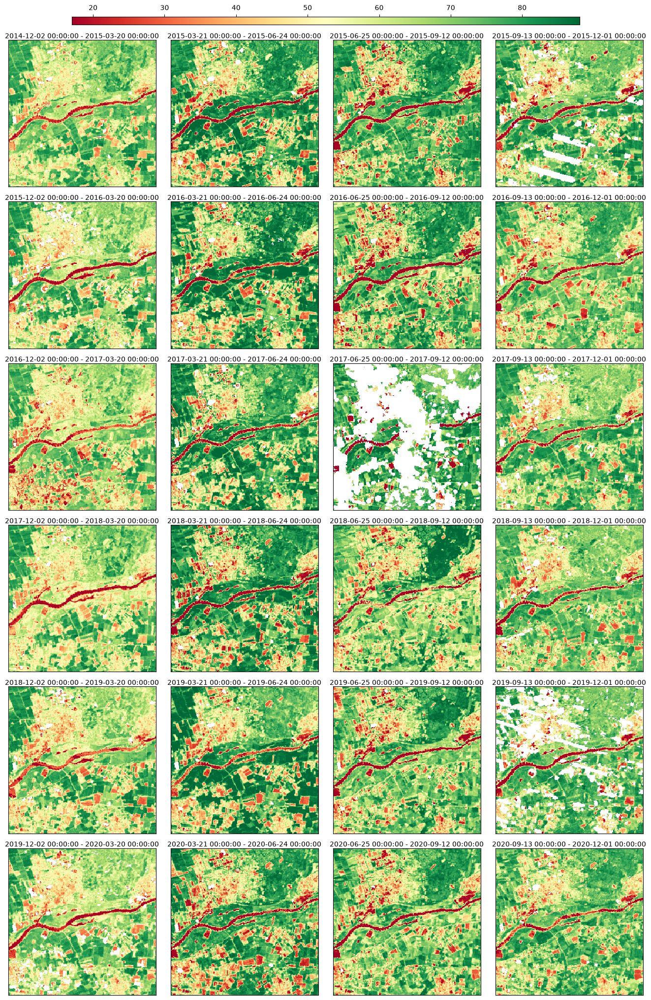

In [2]:
rdata.plot(cmap="RdYlGn", img_title_text="date")

Creating artificial gap at the begeinning of the time series to check that they do not get filled in case of no future images are used

Deleting
Deleting


/skmap/lib/python3.12/site-packages/skmap/io/base.py:1988: UserWarning: Adding colorbar to a different Figure <Figure size 640x480 with 1 Axes> than <Figure size 1290x1940 with 25 Axes> which fig.colorbar is called on.
  cbar_ax = grd_fig.colorbar(


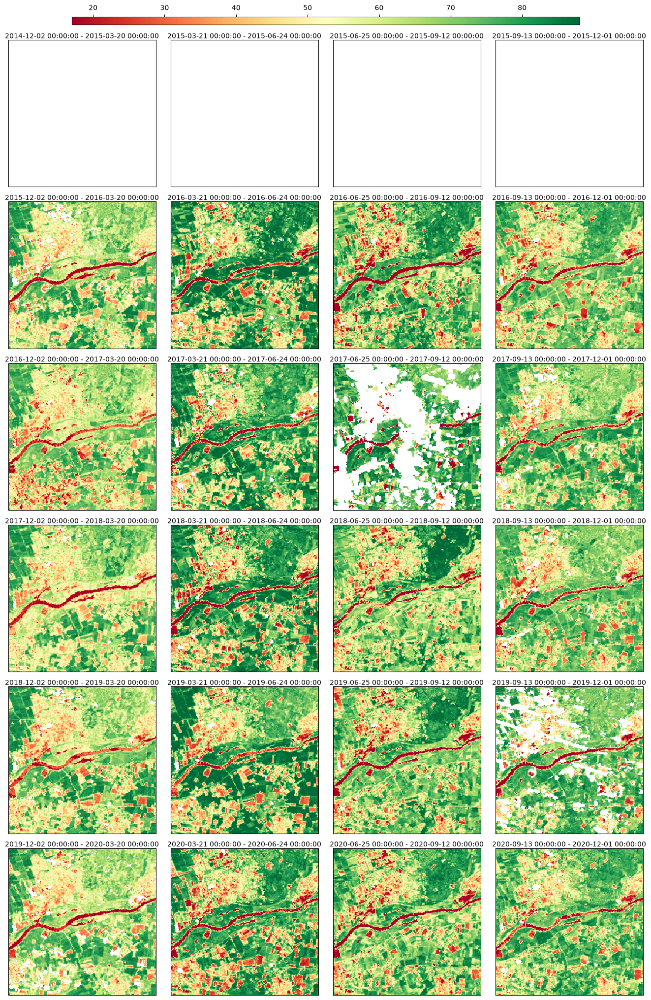

In [3]:
from skmap.parallel import put_shared

arr = rdata.array.get().copy()  # writable copy (object store is read-only)
arr[0:4, :] = np.nan  # gap the first 4 time steps
rdata.array = put_shared(arr)
rdata.plot(cmap="RdYlGn", img_title_text="date")

Gap-filling with SeasConv using only images from the past

[10:07:52] Running SeasConvFill 1 groups


[10:07:53] Creating /tmp/skmap/memmapwwqdwbd4.npy


[10:07:53] Execution time for SeasConvFill: 0.44 segs


[10:07:53] Dropping data and info for groups: ['ndvi']


[10:07:53] Creating /tmp/skmap/memmapj_l06y86.npy


Deleting
Deleting


/skmap/lib/python3.12/site-packages/skmap/io/base.py:1988: UserWarning: Adding colorbar to a different Figure <Figure size 640x480 with 1 Axes> than <Figure size 1290x1940 with 25 Axes> which fig.colorbar is called on.
  cbar_ax = grd_fig.colorbar(


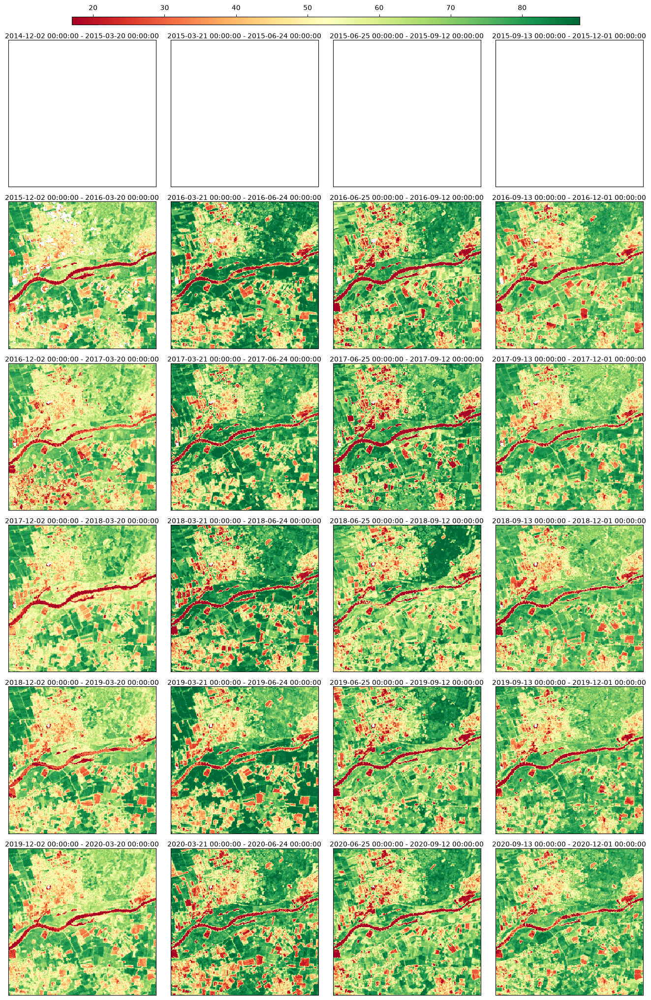

In [4]:
from skmap.io import process

n_imag = rdata.array.shape[0]
seasconv = process.SeasConvFill(season_size=4)
half_conv_vect = seasconv._compute_conv_mat_row(n_imag)
conv_vect_past = half_conv_vect  # default vector for the weights of the past
conv_vect_future = (
    half_conv_vect * 0
)  # Setting to 0 the weights for future images (the first images should stay gap)
rdata = rdata.run(
    process.SeasConvFill(
        season_size=4, conv_vect_past=conv_vect_past, conv_vect_future=conv_vect_future
    ),
    drop_input=True,
)
rdata.plot(cmap="RdYlGn", img_title_text="date")

Creating a vector to visualize the weights used from SeasConv

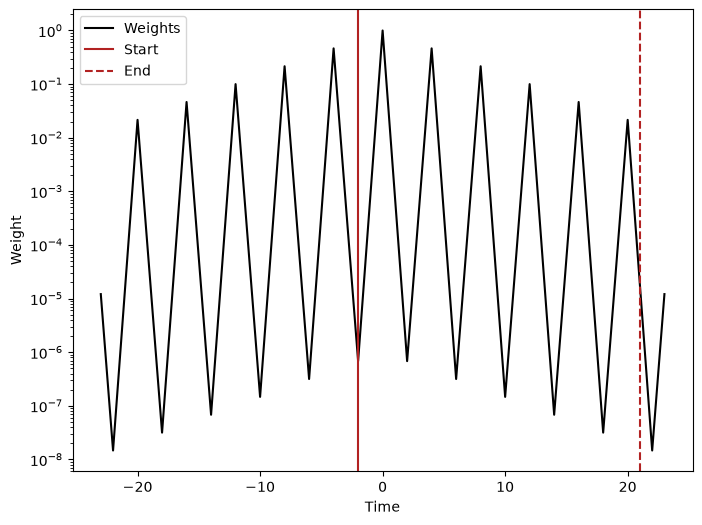

In [5]:
conv_vect_plot = np.concatenate((half_conv_vect[::-1][:-1], (1,), half_conv_vect[1:]))
plt.figure(figsize=(8, 6))
t = np.arange(n_imag * 2 - 1) - n_imag + 1
ts = 2  # Index of the time series for the range to visualize
plt.semilogy(t, conv_vect_plot, "k", label="Weights")
plt.axvline(x=t[n_imag - ts - 1], color="firebrick", label="Start")
plt.axvline(x=t[2 * n_imag - ts - 2], linestyle="--", color="firebrick", label="End")
plt.legend()
plt.xlabel("Time")
plt.ylabel("Weight")
plt.savefig("weights.png", dpi=600)
plt.show()

Same but with no future images

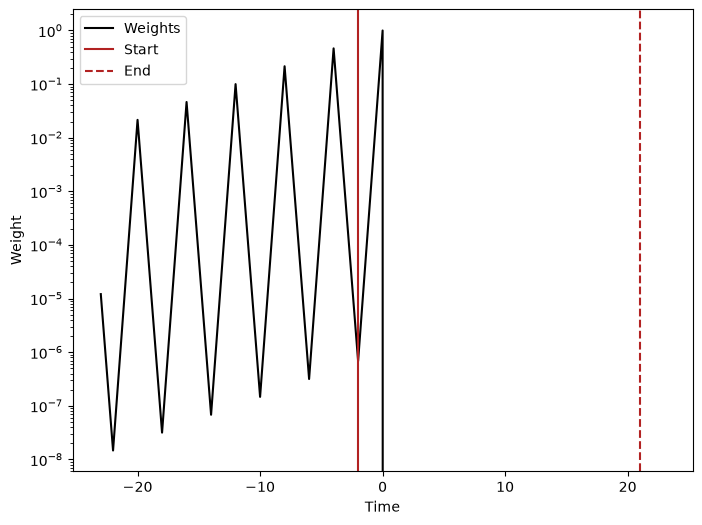

In [6]:
conv_vect_plot = np.concatenate(
    (half_conv_vect[::-1][:-1], (1,), half_conv_vect[1:] * 0)
)
plt.figure(figsize=(8, 6))
t = np.arange(n_imag * 2 - 1) - n_imag + 1
ts = 2  # Index of the time series for the range to visualize
plt.semilogy(t, conv_vect_plot, "k", label="Weights")
plt.axvline(x=t[n_imag - ts - 1], color="firebrick", label="Start")
plt.axvline(x=t[2 * n_imag - ts - 2], linestyle="--", color="firebrick", label="End")
plt.legend()
plt.xlabel("Time")
plt.ylabel("Weight")
plt.savefig("weights_no_future.png", dpi=600)
plt.show()